In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
import random
import os

from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array,load_img
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.layers import GlobalAveragePooling2D,GlobalMaxPooling2D
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix,classification_report

In [2]:
def load_rand():
    X=[]
    dir_path='/kaggle/input/fruits-fresh-and-rotten-for-classification/dataset/train'
    for sub_dir in tqdm(os.listdir(dir_path)):
        path_main=os.path.join(dir_path,sub_dir)
        i=0
        for img_name in os.listdir(path_main):
            if i>=6:
                break
            img=cv2.imread(os.path.join(path_main,img_name))
            img=cv2.resize(img,(224,224))
            img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
            X.append(img)
            i+=1
    return X

In [3]:
images_arr=np.array(load_rand())
images_arr.shape

100%|██████████| 6/6 [00:01<00:00,  5.22it/s]


(36, 224, 224, 3)

# Displaying 36 Images (6 from each class) from the dataset

In [4]:
def show_subpot(X,title=False,Y=None):
    if X.shape[0]==36:
        f, ax= plt.subplots(6,6, figsize=(40,60))
        list_fruits=['rottenbanana','freshoranges','rottenoranges', 'freshbanana', 'rottenapples',   'freshapples']
        for i,img in enumerate(X):
            ax[i//6][i%6].imshow(img, aspect='auto')
            if title==False:
                ax[i//6][i%6].set_title(list_fruits[i//6])
            elif title and Y is not None:
                ax[i//6][i%6].set_title(Y[i])
        plt.show()
    else:
        print('Cannot plot')

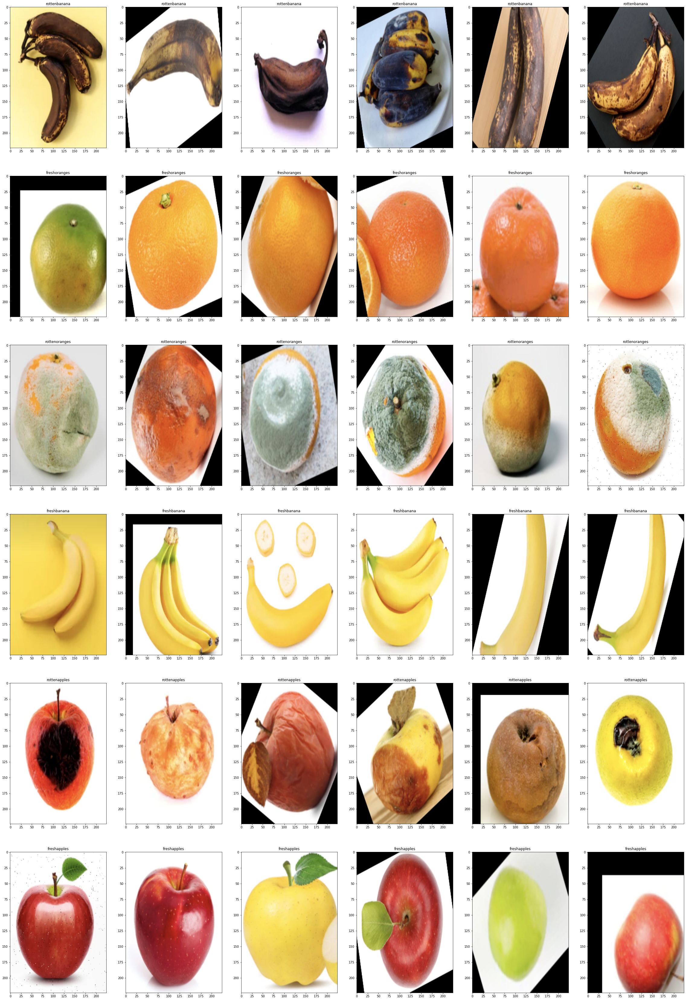

In [5]:
show_subpot(images_arr)

# Displaying the number of images of each class and the classes names

In [6]:
# Train path + Test path
train_dir = '../input/fruits-fresh-and-rotten-for-classification/dataset/train/'
test_dir = '../input/fruits-fresh-and-rotten-for-classification/dataset/test/'

# Train Dataset

train_dir = '../input/fruits-fresh-and-rotten-for-classification/dataset/train/'
#fresh
fresh_apples_train_dir = os.path.join(train_dir, 'freshapples') 
fresh_banana_train_dir = os.path.join(train_dir, 'freshbanana')
fresh_oranges_train_dir = os.path.join(train_dir, 'freshoranges')

#rotten
rotten_apples_train_dir = os.path.join(train_dir, 'rottenapples')
rotten_banana_train_dir = os.path.join(train_dir, 'rottenbanana')
rotten_oranges_train_dir = os.path.join(train_dir, 'rottenoranges')


# Test Dataset
test_dir = '../input/fruits-fresh-and-rotten-for-classification/dataset/test/'
#fresh
fresh_apples_test_dir = os.path.join(test_dir, 'freshapples')
fresh_banana_test_dir = os.path.join(test_dir, 'freshbanana')
fresh_oranges_test_dir = os.path.join(test_dir, 'freshoranges')

#rotten
rotten_apples_test_dir = os.path.join(test_dir, 'rottenapples')
rotten_banana_test_dir = os.path.join(test_dir, 'rottenbanana')
rotten_oranges_test_dir = os.path.join(test_dir, 'rottenoranges')

fresh_apples_train_len=len(os.listdir(fresh_apples_train_dir))
fresh_banana_train_len=len(os.listdir(fresh_banana_train_dir))
fresh_oranges_train_len=len(os.listdir(fresh_oranges_train_dir))
rotten_apples_train_len=len(os.listdir(rotten_apples_train_dir))
rotten_banana_train_len=len(os.listdir(rotten_banana_train_dir))
rotten_oranges_train_len=len(os.listdir(rotten_oranges_train_dir))

# Train Dataset

print("Images of Training Dataset")
print("No. of train fresh apple images : ", fresh_apples_train_len)
print("No. of train fresh banana images : ", fresh_banana_train_len)
print("No. of train fresh orange images : ", fresh_oranges_train_len)
print("No. of train rotten apple images : ", rotten_apples_train_len)
print("No. of train rotten banana images : ", rotten_banana_train_len)
print("No. of train rotten orange images : ", rotten_oranges_train_len)

print(".........................")

# Test Dataset

print("Images of Testing Dataset")
print("No. of test fresh apple images : ", len(os.listdir(fresh_apples_test_dir)))
print("No. of test fresh banana images : ", len(os.listdir(fresh_banana_test_dir)))
print("No. of test fresh orange images : ", len(os.listdir(fresh_oranges_test_dir)))
print("No. of test rotten apple images : ", len(os.listdir(rotten_apples_test_dir)))
print("No. of test rotten banana images : ", len(os.listdir(rotten_banana_test_dir)))
print("No. of test rotten orange images : ", len(os.listdir(rotten_oranges_test_dir)))

# Getting labels of training data
labels = os.listdir('/kaggle/input/fruits-fresh-and-rotten-for-classification/dataset/dataset/train')
print("Classes names:")
print(".......")
labels

Images of Training Dataset
No. of train fresh apple images :  1693
No. of train fresh banana images :  1581
No. of train fresh orange images :  1466
No. of train rotten apple images :  2342
No. of train rotten banana images :  2224
No. of train rotten orange images :  1595
.........................
Images of Testing Dataset
No. of test fresh apple images :  395
No. of test fresh banana images :  381
No. of test fresh orange images :  388
No. of test rotten apple images :  601
No. of test rotten banana images :  530
No. of test rotten orange images :  403
Classes names:
.......


['rottenbanana',
 'freshoranges',
 'rottenoranges',
 'freshbanana',
 'rottenapples',
 'freshapples']

## Augment the Data using ImageDataGenerator

In [65]:
datagen = ImageDataGenerator( 
  rotation_range=20,
  width_shift_range=0.1,
  height_shift_range=0.1,
  shear_range=0.1,
  zoom_range=0.1,
  horizontal_flip=True,
  vertical_flip=True,
  rescale=1./255,  
  validation_split=0.2,       
#    validation_split : The fraction of images reserved for validation (strictly between 0 and 1). 
#    So if the value of 0.2 is used then 20% samples will be reserved for the validation set and remaining 80% for the training set.                    
  preprocessing_function=keras.applications.vgg16.preprocess_input
  )

datagen1= ImageDataGenerator(
  rescale=1./255)

datagen2 = ImageDataGenerator( 
  rotation_range=20,
  width_shift_range=0.1,
  height_shift_range=0.1,
  shear_range=0.1,
  zoom_range=0.1,
  horizontal_flip=True,
  vertical_flip=True,
  rescale=1./255,                          
  #preprocessing_function=keras.applications.vgg16.preprocess_input
  )

## Load Dataset

In [66]:
#train and test dataset paths
train_path='../input/fruits-fresh-and-rotten-for-classification/dataset/train'  
test_path='../input/fruits-fresh-and-rotten-for-classification/dataset/test'

# load and iterate training dataset
train_generator = datagen.flow_from_directory(train_path, 
                                       target_size=[224,224],
                                       color_mode='rgb', 
                                       class_mode="categorical", 
                                       batch_size = 32, 
                                       shuffle=True,
                                       subset='training') 


validation_generator = datagen.flow_from_directory(train_path, 
                                       target_size=[224,224],
                                       color_mode='rgb', 
                                       class_mode="categorical",
                                       batch_size = 32,
                                       shuffle=True,
                                       subset='validation') 

total_train_generator = datagen2.flow_from_directory(train_path, 
                                       target_size=[224,224],
                                       color_mode='rgb', 
                                       class_mode="categorical",
                                       batch_size = 32,
                                       shuffle=True)

# load and iterate testing dataset 
test_generator = datagen1.flow_from_directory(test_path, 
                                      target_size=[224,224],                                    
                                      color_mode='rgb', 
                                      class_mode="categorical",
                                      batch_size = 32) 

Found 8723 images belonging to 6 classes.
Found 2178 images belonging to 6 classes.
Found 10901 images belonging to 6 classes.
Found 2698 images belonging to 6 classes.


In [10]:
train_generator.class_indices

{'freshapples': 0,
 'freshbanana': 1,
 'freshoranges': 2,
 'rottenapples': 3,
 'rottenbanana': 4,
 'rottenoranges': 5}

In [11]:
validation_generator.class_indices

{'freshapples': 0,
 'freshbanana': 1,
 'freshoranges': 2,
 'rottenapples': 3,
 'rottenbanana': 4,
 'rottenoranges': 5}

In [12]:
total_train_generator.class_indices

{'freshapples': 0,
 'freshbanana': 1,
 'freshoranges': 2,
 'rottenapples': 3,
 'rottenbanana': 4,
 'rottenoranges': 5}

In [13]:
test_generator.class_indices

{'freshapples': 0,
 'freshbanana': 1,
 'freshoranges': 2,
 'rottenapples': 3,
 'rottenbanana': 4,
 'rottenoranges': 5}

# **Building The Deep Model Using Cnn**

In [90]:
import tensorflow as tf

from tensorflow.keras import datasets, layers, models


model0 = keras.models.Sequential()

model0.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model0.add(layers.MaxPooling2D((2, 2)))

model0.add(layers.Conv2D(64, (3, 3), activation='relu'))
model0.add(layers.MaxPooling2D((2, 2)))

model0.add(layers.Conv2D(128, (3, 3), activation='relu'))
model0.add(layers.MaxPooling2D((2, 2)))

model0.add(layers.Conv2D(128, (3, 3), activation='relu'))
model0.add(layers.MaxPooling2D((2, 2)))

model0.add(layers.Flatten())

model0.add(layers.Dense(512, activation='relu'))
model0.add(layers.Dense(6,activation='softmax'))

In [91]:
model0.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 54, 54, 64)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 52, 52, 128)       73856     
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 26, 26, 128)       0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 24, 24, 128)      

In [92]:
model0.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Training the cnn model with 20 epochs

In [93]:
history0 = model0.fit(total_train_generator,
          validation_data=test_generator,
          steps_per_epoch=total_train_generator.samples/total_train_generator.batch_size, 
          validation_steps=test_generator.samples/test_generator.batch_size, 
          epochs=20)

Epoch 1/20
340/340 [==============================] - 174s 508ms/step - loss: 0.6807 - accuracy: 0.7436 - val_loss: 0.4514 - val_accuracy: 0.8365
Epoch 2/20
340/340 [==============================] - 176s 516ms/step - loss: 0.3834 - accuracy: 0.8643 - val_loss: 0.3048 - val_accuracy: 0.8840
Epoch 3/20
340/340 [==============================] - 173s 507ms/step - loss: 0.2772 - accuracy: 0.8981 - val_loss: 0.2359 - val_accuracy: 0.9159
Epoch 4/20
340/340 [==============================] - 172s 505ms/step - loss: 0.2587 - accuracy: 0.9043 - val_loss: 0.3499 - val_accuracy: 0.8651
Epoch 5/20
340/340 [==============================] - 172s 504ms/step - loss: 0.2056 - accuracy: 0.9215 - val_loss: 0.1352 - val_accuracy: 0.9463
Epoch 6/20
340/340 [==============================] - 171s 503ms/step - loss: 0.1866 - accuracy: 0.9313 - val_loss: 0.1749 - val_accuracy: 0.9314
Epoch 7/20
340/340 [==============================] - 173s 506ms/step - loss: 0.1630 - accuracy: 0.9406 - val_loss: 0.1382 -

# Plotting Training and Validation **Accuracy**


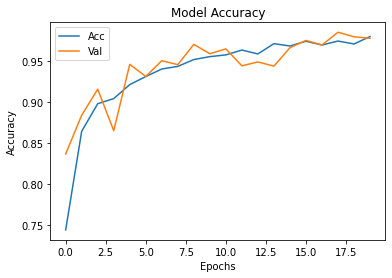

In [94]:
plt.plot(history0.history['accuracy'])
plt.plot(history0.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Acc','Val'], loc = 'upper left')

# Plotting Training and Validation **Error**

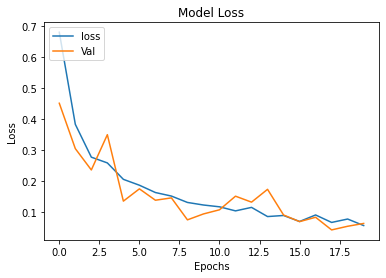

In [95]:
plt.plot(history0.history['loss'])
plt.plot(history0.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['loss','Val'], loc = 'upper left')

# Evaluating the model on test data (bad loss result given)

In [98]:
result0=model0.evaluate(test_generator, steps=test_generator.samples/test_generator.batch_size)
print(result0)
print('Error on testing dataset: ', result0[0])
print('Accuracy on testing dataset: ', result0[1])

84/84 [==============================] - 14s 164ms/step - loss: 0.6701 - accuracy: 0.7869
[0.6701358556747437, 0.7868791818618774]
Error on testing dataset:  0.6701358556747437
Accuracy on testing dataset:  0.7868791818618774


## Saving the model

In [99]:
model0.save('/kaggle/working/rottenvsfresh_cnn_model.h5')

## Loading the model

In [101]:
from keras.models import load_model
model0=load_model('../input/rottenvsfresh-fruits-model/rottenvsfresh_cnn_model.h5')

# **Building The Deep Model Using Pretrained VGG16 Model**

## Load VGG16 Model with ImageNet weights
#### And also remove the last layer of the model.
### Transfer Learning

In [67]:
vgg16_model=keras.applications.VGG16(weights='imagenet',input_shape=(224, 224, 3),include_top=False) 
#input_shape=(224,224,3),pictures of dataset are in color so they have three dimensions:height,width,number of channels which are three (red,green,blue)

# The 5 blocks of VGG16 Pretrained Model

In [68]:
vgg16_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

# Adding layers to the pretrained VGG16 model
#### the last dense layer has the same number of neurons of the classes in the dataset.
### Freeze the model


In [69]:
vgg16_model.trainable = False

In [59]:
# Create inputs with correct shape
inputs = vgg16_model.input

# Call the VGG16 model
x = vgg16_model(inputs,training=False)

#pooling layer 
x = keras.layers.GlobalAveragePooling2D()(x)

# Add final dense layer with softmax as activation function
outputs = keras.layers.Dense(6, activation = 'softmax')(x)

# Combine inputs and outputs to create model
model1 = keras.Model(inputs=inputs, outputs=outputs)

In [70]:
model1.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        [(None, 224, 224, 3)]     0         
_________________________________________________________________
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 512)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 6)                 3078      
Total params: 14,717,766
Trainable params: 3,078
Non-trainable params: 14,714,688
_________________________________________________________________


## Compile Model with categorical_crossentropy as loss function and adam optimizer

In [71]:
model1.compile(loss='categorical_crossentropy',metrics=['accuracy'], optimizer='adam')   

## Training the Model with 20 epochs

In [72]:
history1 = model1.fit(total_train_generator,
          validation_data=test_generator,
          steps_per_epoch=total_train_generator.samples/total_train_generator.batch_size, 
          validation_steps=test_generator.samples/test_generator.batch_size, 
          epochs=20)

Epoch 1/20
340/340 [==============================] - 183s 535ms/step - loss: 0.4414 - accuracy: 0.8473 - val_loss: 0.3332 - val_accuracy: 0.8884
Epoch 2/20
340/340 [==============================] - 180s 529ms/step - loss: 0.3595 - accuracy: 0.8796 - val_loss: 0.3000 - val_accuracy: 0.8970
Epoch 3/20
340/340 [==============================] - 180s 529ms/step - loss: 0.3311 - accuracy: 0.8914 - val_loss: 0.2817 - val_accuracy: 0.9081
Epoch 4/20
340/340 [==============================] - 181s 531ms/step - loss: 0.2987 - accuracy: 0.9034 - val_loss: 0.2644 - val_accuracy: 0.9096
Epoch 5/20
340/340 [==============================] - 176s 518ms/step - loss: 0.2890 - accuracy: 0.9055 - val_loss: 0.2592 - val_accuracy: 0.9118
Epoch 6/20
340/340 [==============================] - 177s 519ms/step - loss: 0.2704 - accuracy: 0.9123 - val_loss: 0.2403 - val_accuracy: 0.9188
Epoch 7/20
340/340 [==============================] - 177s 520ms/step - loss: 0.2578 - accuracy: 0.9188 - val_loss: 0.2325 -

# Plotting Training and Validation **Accuracy**

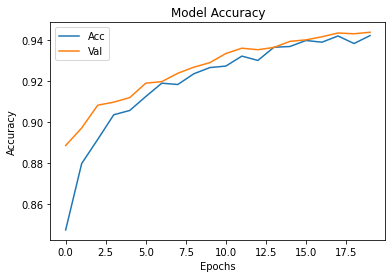

In [73]:
plt.plot(history1.history['accuracy'])
plt.plot(history1.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Acc','Val'], loc = 'upper left')

# Plotting Training and Validation **Error**

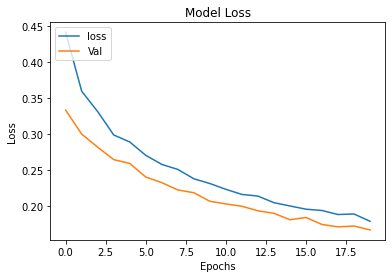

In [74]:
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['loss','Val'], loc = 'upper left')

# Evaluating the model on the testing dataset

In [78]:
result1=model1.evaluate(test_generator, steps=test_generator.samples/test_generator.batch_size)
print(result1)
print('Error on testing dataset: ', result1[0])
print('Accuracy on testing dataset: ', result1[1])

84/84 [==============================] - 15s 180ms/step - loss: 0.1419 - accuracy: 0.9533
[0.14192403852939606, 0.9532987475395203]
Error on testing dataset:  0.14192403852939606
Accuracy on testing dataset:  0.9532987475395203


## Saving the model

In [103]:
model1.save('/kaggle/working/rottenvsfresh_vgg16_model.h5')

## Loading the model (the best model)

In [81]:
from keras.models import load_model
model1=load_model('../input/rottenvsfresh-fruits-model/rottenvsfresh_vgg16_model.h5')

# Testing the final model on a new photo from the testing dataset

In [46]:
names = [fresh_apples_test_dir,
         fresh_banana_test_dir,
         fresh_oranges_test_dir,
         rotten_apples_test_dir,
         rotten_banana_test_dir,
         rotten_oranges_test_dir
]

def load_rand_test_image():
    X=[]
    dir_path='/kaggle/input/fruits-fresh-and-rotten-for-classification/dataset/test'
    for sub_dir in tqdm(os.listdir(dir_path)):
        path_main=os.path.join(dir_path,sub_dir)
        i=0
        for img_name in os.listdir(path_main):
            if i>=5:
                break
            img=cv2.imread(os.path.join(path_main,img_name))
            img=cv2.resize(img,(224,224))
            img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
            X.append(img)
            i+=1
    return X

def show_subpot(X,title=False,Y=None):
    if X.shape[0]==30:
        f, ax= plt.subplots(6,5, figsize=(40,60))
        list_fruits=['rottenbanana','freshoranges','rottenoranges', 'freshbanana', 'rottenapples',   'freshapples']
        for i,img in enumerate(X):
            ax[i//5][i%5].imshow(img, aspect='auto')
            if title==False:
                ax[i//5][i%5].set_title(list_fruits[i//5])
            elif title and Y is not None:
                ax[i//5][i%5].set_title(Y[i])
        plt.show()
    else:
        print('Cannot plot')
        
test_images_arr=np.array(load_rand_test_image())
test_images_arr.shape

100%|██████████| 6/6 [00:00<00:00, 37.98it/s]


(30, 224, 224, 3)

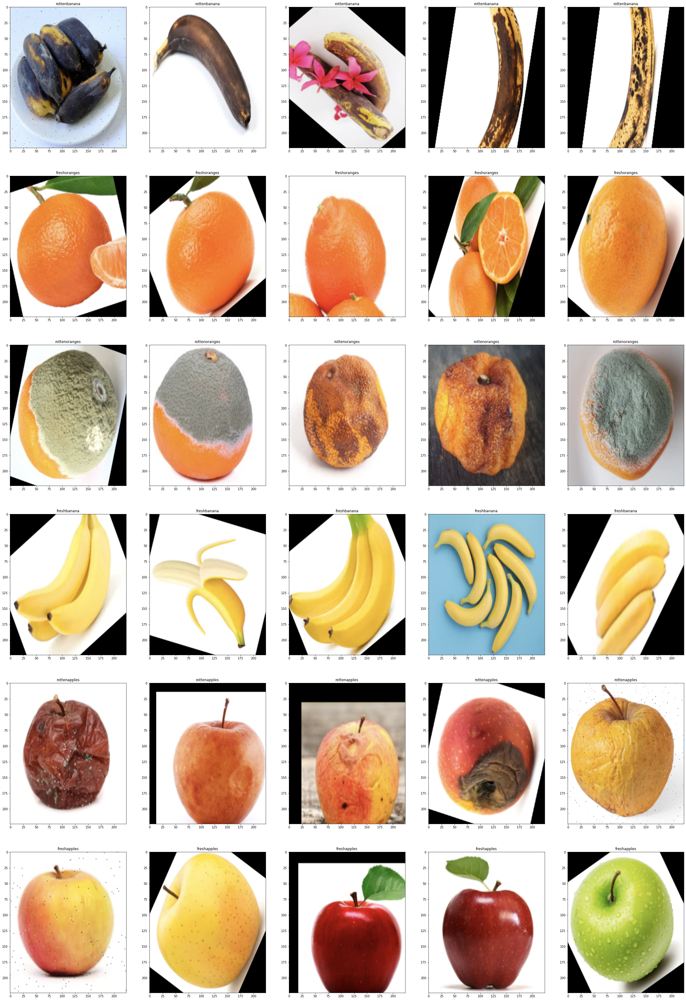

In [47]:
show_subpot(test_images_arr) 

In [83]:
# class mapping to indices by the data generator
# {'freshapples': 0,
#  'freshbanana': 1,
#  'freshoranges': 2,
#  'rottenapples': 3,
#  'rottenbanana': 4,
#  'rottenoranges': 5}

#Change the model name here
classes = model1.predict(test_images_arr, batch_size=32) #model1
img_acc=[]
for i,cl_pr in enumerate(classes):
    
    class_ind=np.argmax(cl_pr)
    img_acc.append(class_ind)

    prediction = ''

    if class_ind==0:
        prediction = 'fresh apple'
    elif class_ind==1:
        prediction = 'fresh banana'
    elif class_ind==2:
        prediction = 'fresh orange'
    elif class_ind==3:
        prediction = 'rotten apple'
    elif class_ind==4:
        prediction = 'rotten banana'
    elif class_ind==5:
        prediction = 'rotten orange'

    print("The predicted class on image number ",i+1," is class number ",class_ind," and the class name ",prediction)
    print("......................................................................")

print("The Correct labels of the images :","\n 4 4 4 4 4 2 2 2 2 2 5 5 5 5 5 1 1 1 1 1 3 3 3 3 3 0 0 0 0 0")
print("The predicted labels of the images :",img_acc)

The predicted class on image number  1  is class number  4  and the class name  rotten banana
......................................................................
The predicted class on image number  2  is class number  4  and the class name  rotten banana
......................................................................
The predicted class on image number  3  is class number  4  and the class name  rotten banana
......................................................................
The predicted class on image number  4  is class number  4  and the class name  rotten banana
......................................................................
The predicted class on image number  5  is class number  4  and the class name  rotten banana
......................................................................
The predicted class on image number  6  is class number  2  and the class name  fresh orange
......................................................................
The predict

the path of the photo is  ../input/fruits-fresh-and-rotten-for-classification/dataset/test/freshapples/rotated_by_75_Screen Shot 2018-06-08 at 5.20.56 PM.png
<class 'PIL.Image.Image'>
class predicted by the model 0
The name of the predicted class: fresh apple


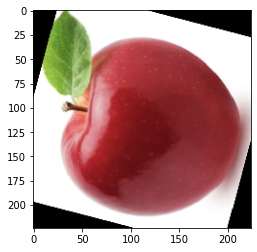

In [87]:
names = [fresh_apples_test_dir,
         fresh_banana_test_dir,
         fresh_oranges_test_dir,
         rotten_apples_test_dir,
         rotten_banana_test_dir,
         rotten_oranges_test_dir
]

name_rand = random.choice(names)
filename = os.listdir(name_rand)
sample = random.choice(filename)
fn = os.path.join(name_rand,sample)
print("the path of the photo is ",fn)


img = load_img(fn, target_size=(224,224))
print(type(img))
plt.imshow(img)


x = img_to_array(img)
x = np.expand_dims(x, axis=0)
images = np.vstack([x])

#change the model here
classes = model1.predict(images, batch_size=32)
class_ind=np.argmax(classes[0])
print("class predicted by the model",class_ind)


prediction = ''

if class_ind==0:
    prediction = 'fresh apple'
elif class_ind==1:
    prediction = 'fresh banana'
elif class_ind==2:
    prediction = 'fresh orange'
elif class_ind==3:
    prediction = 'rotten apple'
elif class_ind==4:
    prediction = 'rotten banana'
elif class_ind==5:
    prediction = 'rotten orange'

print("The name of the predicted class:",prediction)